In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
import plotting_scripts as ps

In [5]:
from paperII import load
from cr_zprof import cr_data_load

[1783440455.962144] [stellar-vis1:217853:0]        ib_iface.c:1231 UCX  ERROR mlx5_0: ibv_create_cq(cqe=4096) failed: Cannot allocate memory : Please set max locked memory (ulimit -l) to 'unlimited' (current: 64 kbytes)
[1783440455.962163] [stellar-vis1:217853:0]      ucp_worker.c:1415 UCX  ERROR uct_iface_open(rc_verbs/mlx5_0:1) failed: Input/output error


[stellar-vis1.princeton.edu:217853] pml_ucx.c:309  Error: Failed to create UCP worker


In [6]:
basedir = "/scratch/gpfs/changgoo/tigress_classic/"
model_dict = cr_data_load(basedir,'*b1-*Vmax2-rst')
model_dict.update(cr_data_load(basedir,'*sigma28*'))

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va-1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va0
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va1


In [7]:
model_dict

{'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst',
 'crmhd-8pc-b1-diode-lngrad_out-sigma28_va-1': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma28_va-1',
 'crmhd-8pc-b1-diode-lngrad_out-sigma28_va0': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma28_va0',
 'crmhd-8pc-b1-diode-lngrad_out-sigma28_va1': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma28_va1'}

In [8]:
group="s28"

In [9]:
simgroup, model_name, model_color = load(model_dict,"all",tslice=slice(270,500),
                                         colors=["#E77500","xkcd:pink","xkcd:orchid","xkcd:coral"],verbose=False)

[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst --> crmhd: crmhd


[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma28_va-1 --> sigma28-nost: σ28-nost
Renamed crmhd-8pc-b1-diode-lngrad_out-sigma28_va0 --> sigma28-vAtot: σ28-vAtot


[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma28_va1 --> sigma28-vAi: σ28
loading crmhd...
loading sigma28-nost...
loading sigma28-vAtot...
loading sigma28-vAi...
Loaded crmhd in group all with name crmhd and color #E77500
Loaded sigma28-nost in group all with name σ28-nost and color xkcd:pink
Loaded sigma28-vAtot in group all with name σ28-vAtot and color xkcd:orchid
Loaded sigma28-vAi in group all with name σ28 and color xkcd:coral


In [10]:
simgroup[group] = {m:s for m,s in simgroup["all"].items() if m != "crmhd"}

In [11]:
simgroup

{'all': {'crmhd': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5e73fdf70>,
  'sigma28-nost': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7530>,
  'sigma28-vAtot': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7470>,
  'sigma28-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7440>},
 's28': {'sigma28-nost': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7530>,
  'sigma28-vAtot': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7470>,
  'sigma28-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14a5dd5e7440>}}

In [33]:
for m,s in simgroup["all"].items():
    zp_pp = s.load_zprof_postproc()
    print(m, hasattr(s,"zp_pp_ph"))

crmhd True
sigma28-nost True
sigma28-vAtot True
sigma28-vAi True


In [12]:
model_color["sigma28-nost"]="xkcd:pink"
model_color["sigma28-vAtot"]="xkcd:orchid"

In [13]:
ps.setup(f"../{group}_figures", model_name, model_color)

crmhd sfr40 0.0035970609783096126 0.0011778264390705573
σ28-nost sfr40 0.0013372712163822356 0.0005195812548822203
σ28-vAtot sfr40 0.0023981674433176505 0.0007244138259878729
σ28 sfr40 0.0028914728628512457 0.0012815730804987032
crmhd Sigma_gas 7.856706284548293 9.890343811315356
σ28-nost Sigma_gas 3.9075738207427304 7.85132866217694
σ28-vAtot Sigma_gas 6.726603660420842 9.410343842545942
σ28 Sigma_gas 7.492608229519377 9.84925688951317
crmhd Sigma_out 1.0852702355157413 2.3678779846034477
σ28-nost Sigma_out 3.63592369837504 7.278328846871344
σ28-vAtot Sigma_out 1.8073882171301603 4.042528556200685
σ28 Sigma_out 1.3356150671463958 2.9979230519588542


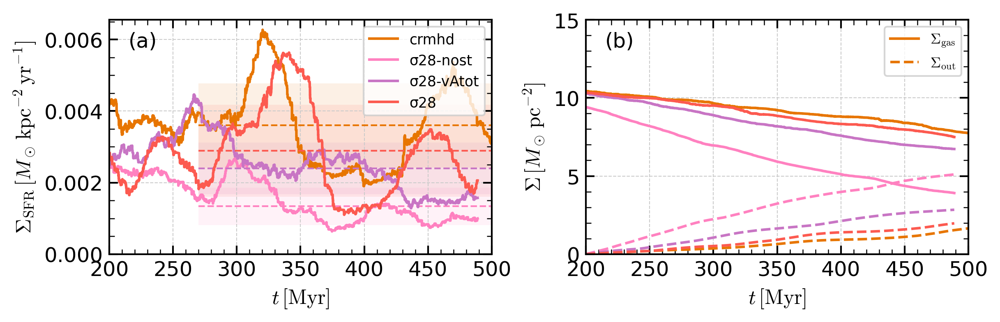

In [14]:
f = ps.plot_history(simgroup,"all",tmin=200,tmax=500)

crmhd Pok_cr 12004.469112702483 12053.830198920405
crmhd 696.2698476366196
crmhd Pok_th 3801.2754615858585 3675.9005585638306
crmhd 220.47734569641204
crmhd Pok_kin 13014.348699492839 13093.416381477246
crmhd 754.8437586879478
crmhd Pi_B 1124.619534883126 1115.2068561676722
crmhd 65.22892973031774
σ28-nost Pok_cr 14229.326401897497 13806.756769506666
σ28-nost 2219.970863954692
σ28-nost Pok_th 2110.9532249685353 2014.922233503485
σ28-nost 329.3377720238693
σ28-nost Pok_kin 2530.264033475717 2398.464942317815
σ28-nost 394.7560322798922
σ28-nost Pi_B 555.1519807158303 508.51953352526505
σ28-nost 86.61135372448379
σ28-vAtot Pok_cr 19117.67550706704 19231.759276472505
σ28-vAtot 1663.175247283545
σ28-vAtot Pok_th 2988.4939066409243 2838.5654313850578
σ28-vAtot 259.9891964033772
σ28-vAtot Pok_kin 5955.484326097195 5512.642784830642
σ28-vAtot 518.1076597460026
σ28-vAtot Pi_B 610.3219793681717 551.7552952881816
σ28-vAtot 53.0960162276533
σ28 Pok_cr 14319.293858897898 14544.348568851334
σ28 1033

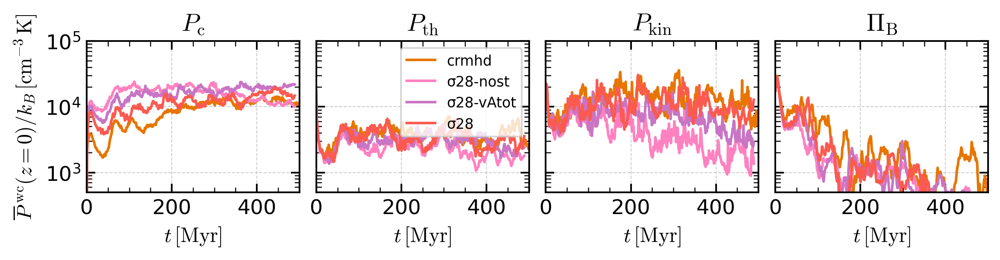

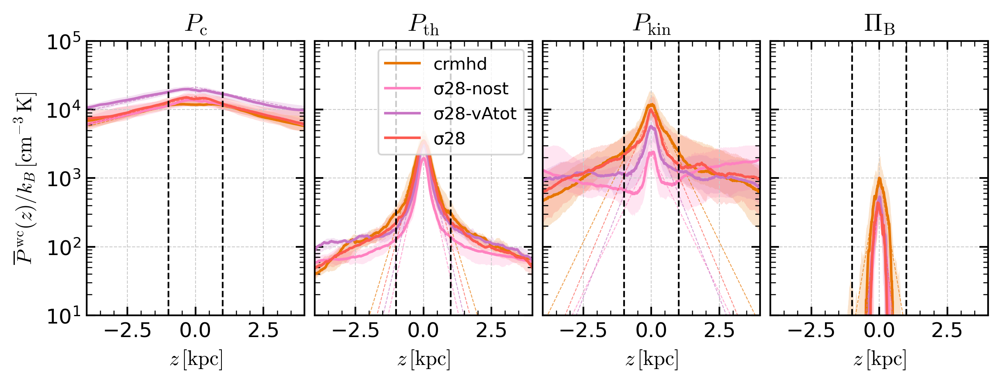

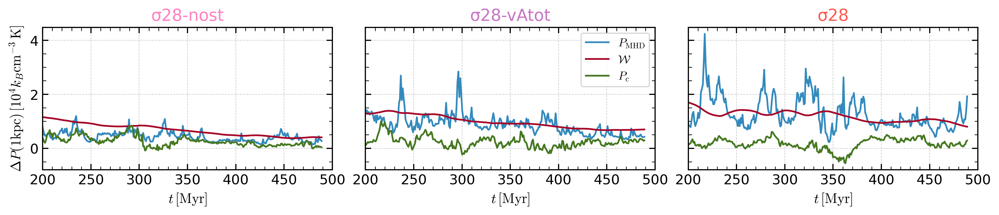

In [15]:
f=ps.plot_pressure_t(simgroup, "all", zslice=slice(-50,50), tmax=500)
f=ps.plot_pressure_z(simgroup, "all")
f=ps.plot_vertical_equilibrium_t(simgroup, group, tmin=200, zmax=1000)

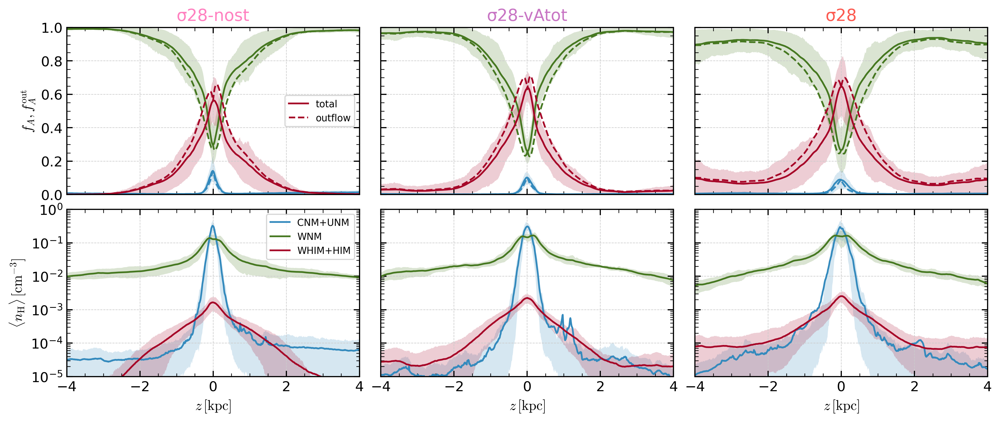

In [16]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

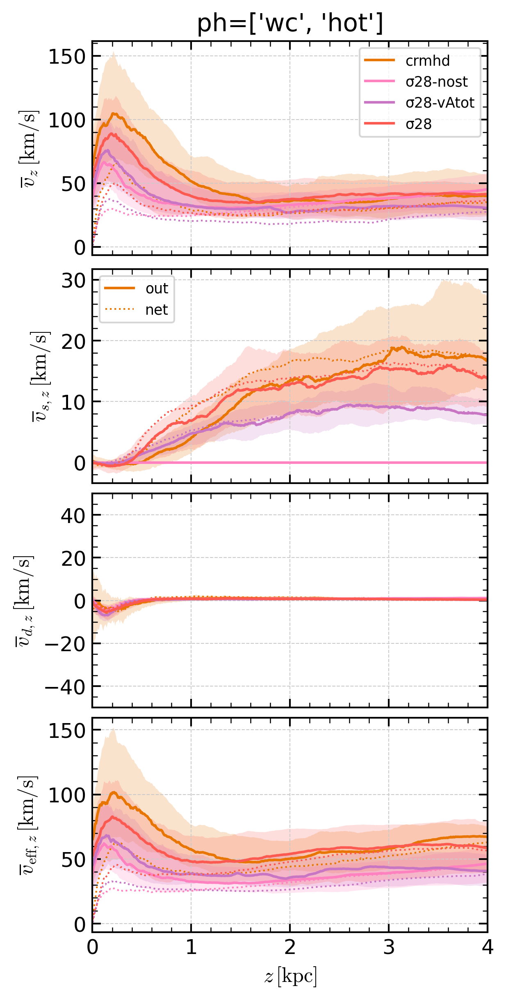

In [17]:
f = ps.plot_velocity_z(simgroup, "all", ph=["wc","hot"])

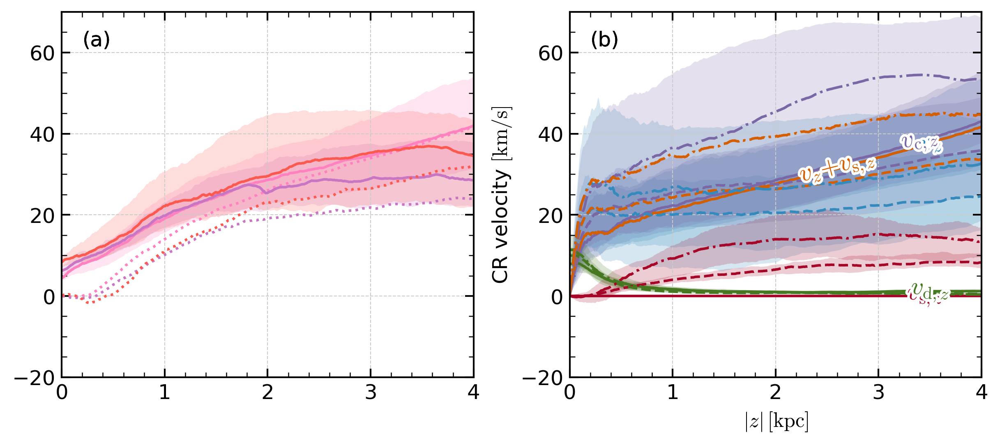

In [34]:
f = ps.plot_cr_velocity_z(simgroup, group, both=True)

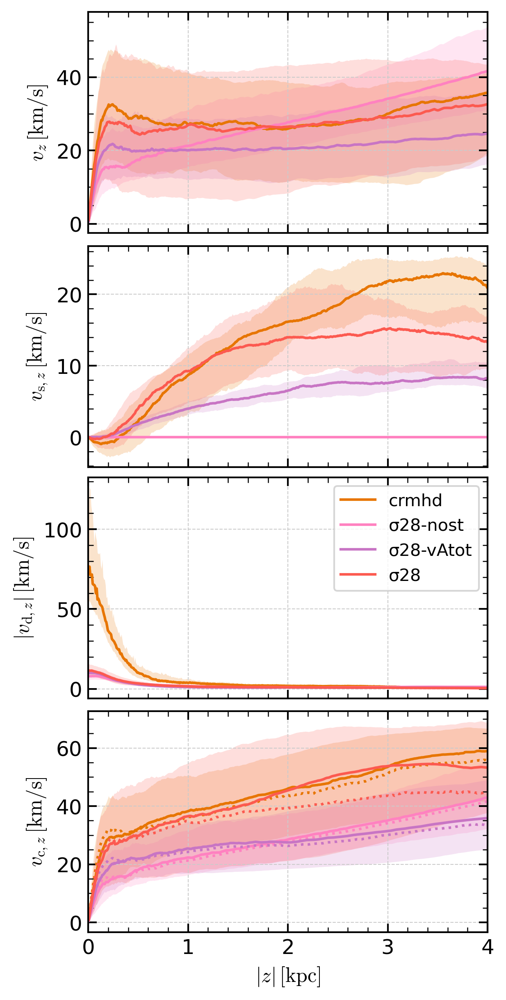

In [35]:
f = ps.plot_cr_velocity_z_all(simgroup, "all")

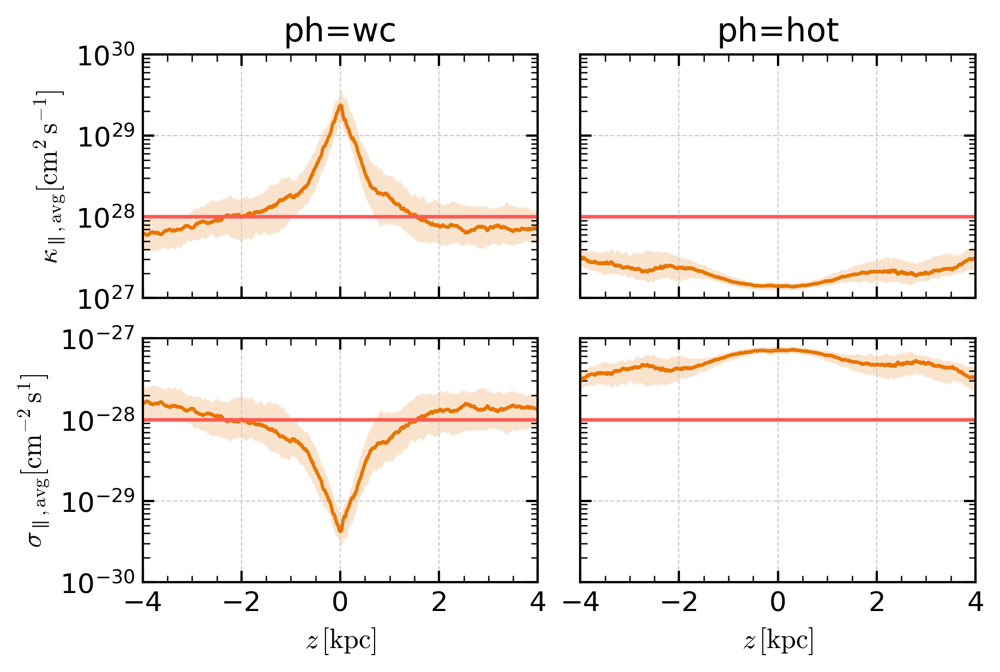

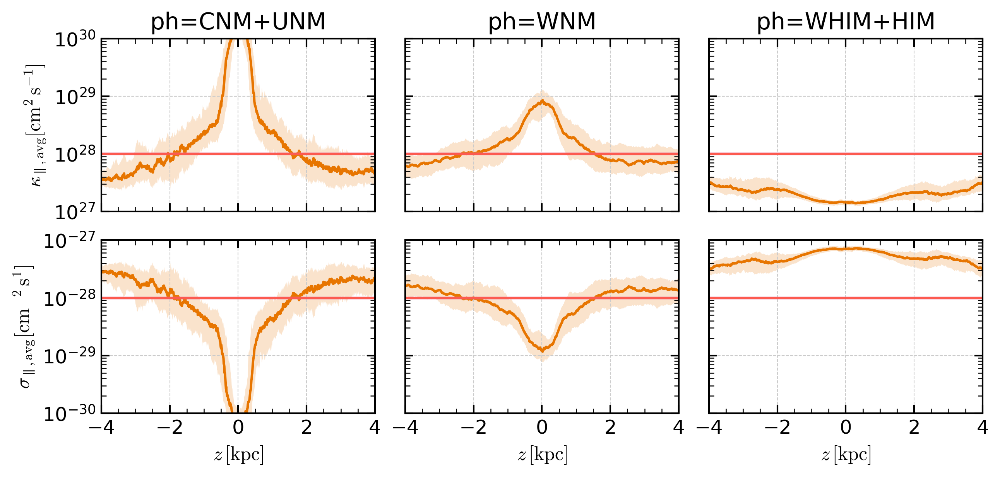

In [18]:
f=ps.plot_kappa_z(simgroup, "all")
f=ps.plot_kappa_z(
    simgroup,
    "all",
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
)

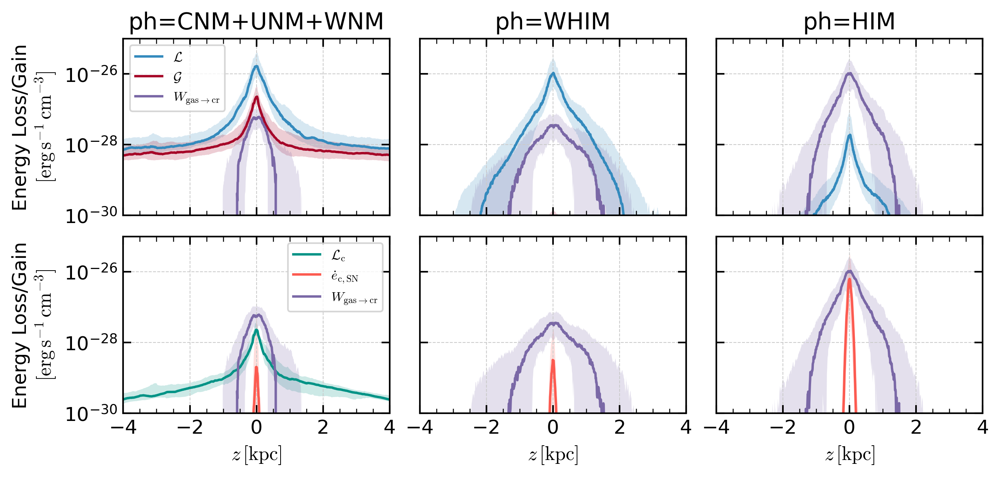

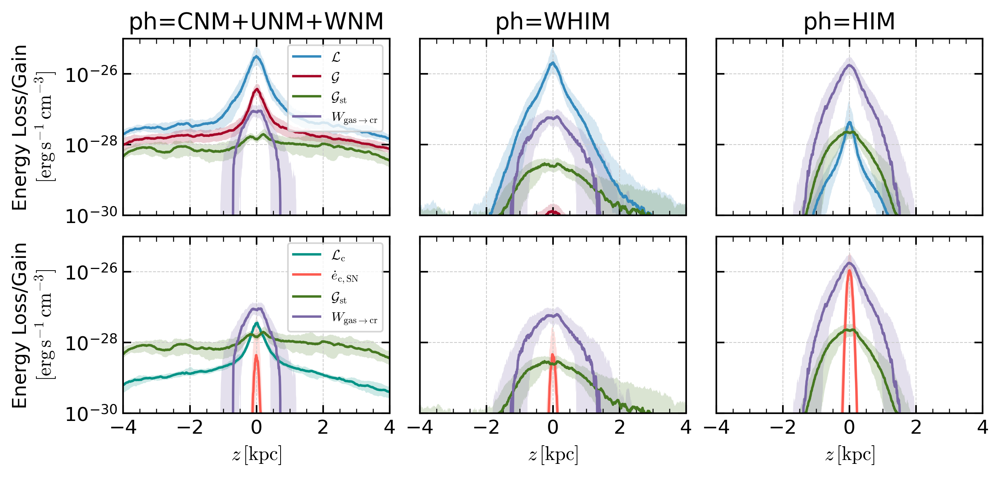

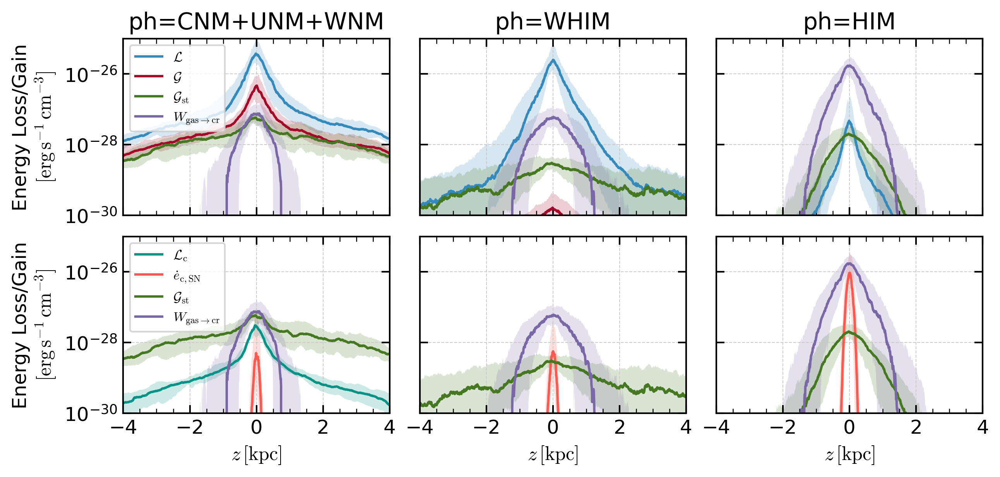

In [19]:
for m, s in simgroup[group].items():
    ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

(200.0, 500.0)

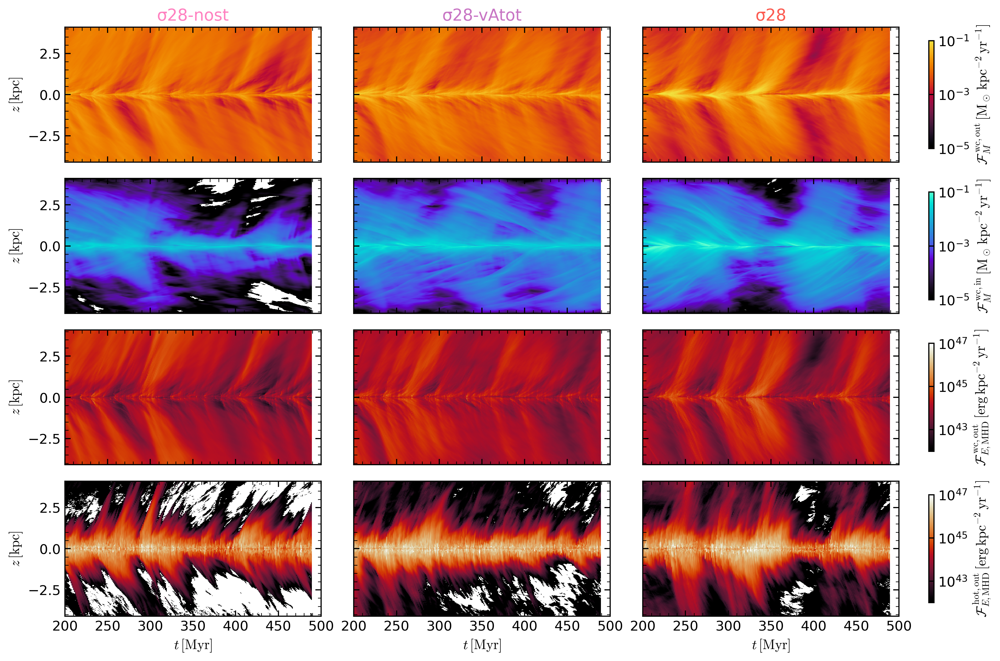

In [20]:
f=ps.plot_flux_tz(simgroup, group)
f.axes[0].set_xlim(200,500)

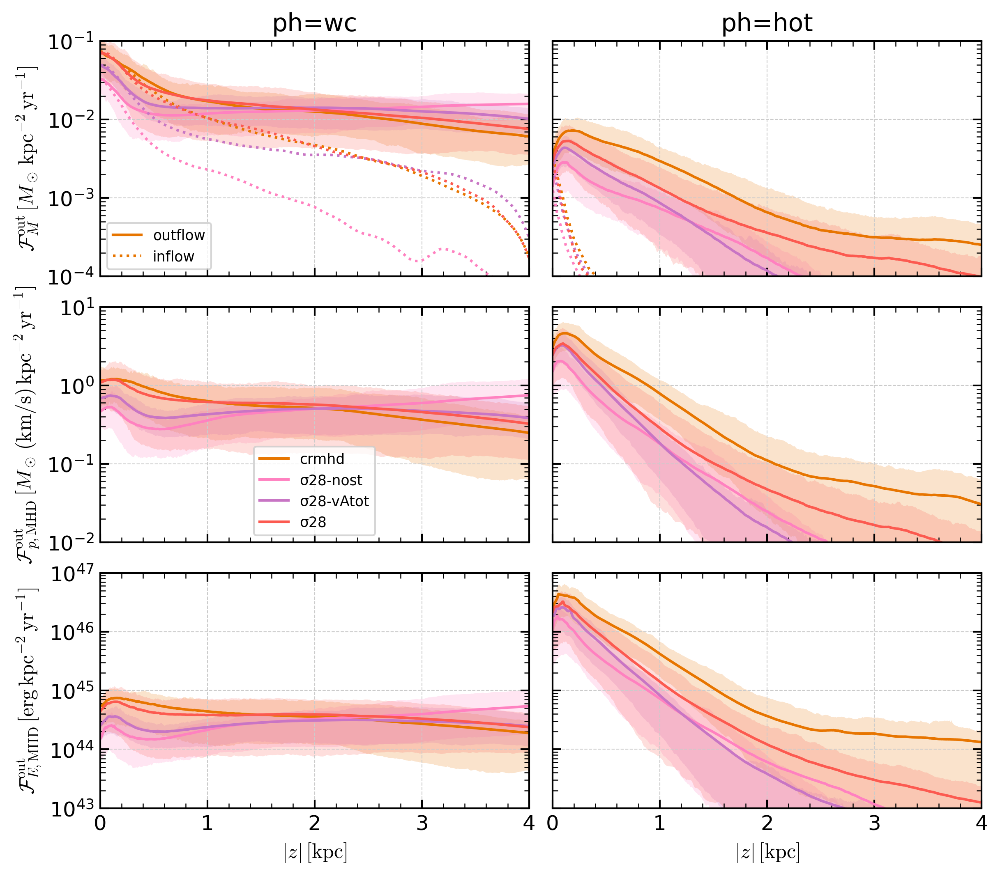

In [21]:
f=ps.plot_flux_z(simgroup, "all", vz_dir=1, both=True)

crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.92978804 2.67700478 2.37148174 2.01168133 1.70768031], eta_p_MHD=[0.73273951 0.35463613 0.15497164 0.09484688 0.05811078], eta_E_MHD=[0.39380598 0.11879489 0.01759594 0.01135197 0.00845682]
crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.87808943 0.94199653 0.81172842 0.65565065 0.5716168 ], eta_E_CR=[0.27635137 0.35587952 0.3647082  0.33640089 0.31415506]
σ28-nost ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[ 6.21306391  7.71939826  9.35217048 10.73278647 11.8329667 ], eta_p_MHD=[0.53303147 0.33295618 0.30618504 0.34202438 0.42576737], eta_E_MHD=[0.21697973 0.06536712 0.02711343 0.02888186 0.03862752]
σ28-nost ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[3.01766459 2.79792097 2.30492011 1.90947161 1.50364885], eta_E_CR=[0.60279076 0.68523589 0.69766634 0.69471976 0.67547646]
σ28-vAtot ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: e

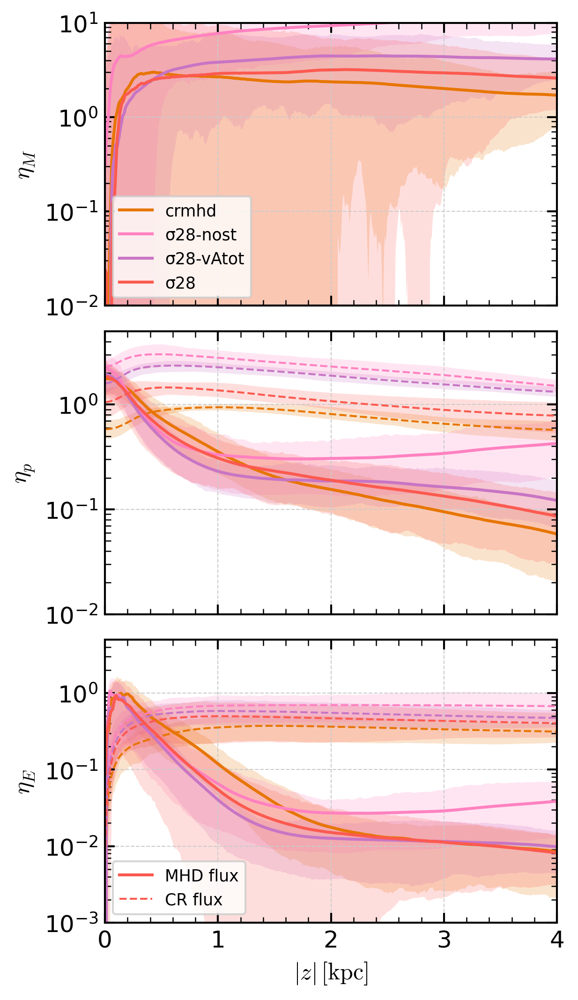

In [22]:
f=ps.plot_loading_z_merged(simgroup, "all", vz_dir=None, both=True)

crmhd 2107.740565822015
σ28-nost 965.9859186492117
σ28-vAtot 1306.2861100410669
σ28 2129.0915226631328


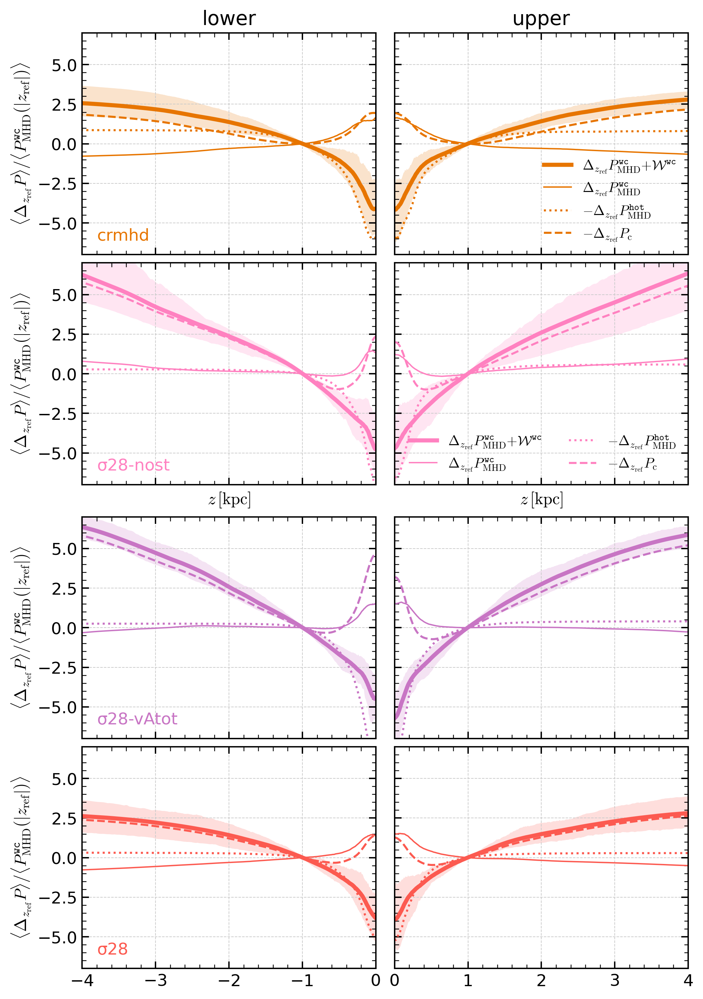

In [37]:
f=ps.plot_momentum_transfer_z(simgroup, "all", show_option=1, zmin=0, zref=1000)
plt.setp(f.axes,ylim=(-7,7))
plt.savefig(os.path.join(ps.fig_outdir, f"{group}_dflux_1.pdf"))

In [24]:
from cr_zprof import load_windpdf
for m, s in simgroup[group].items():
    load_windpdf(s, both=True)

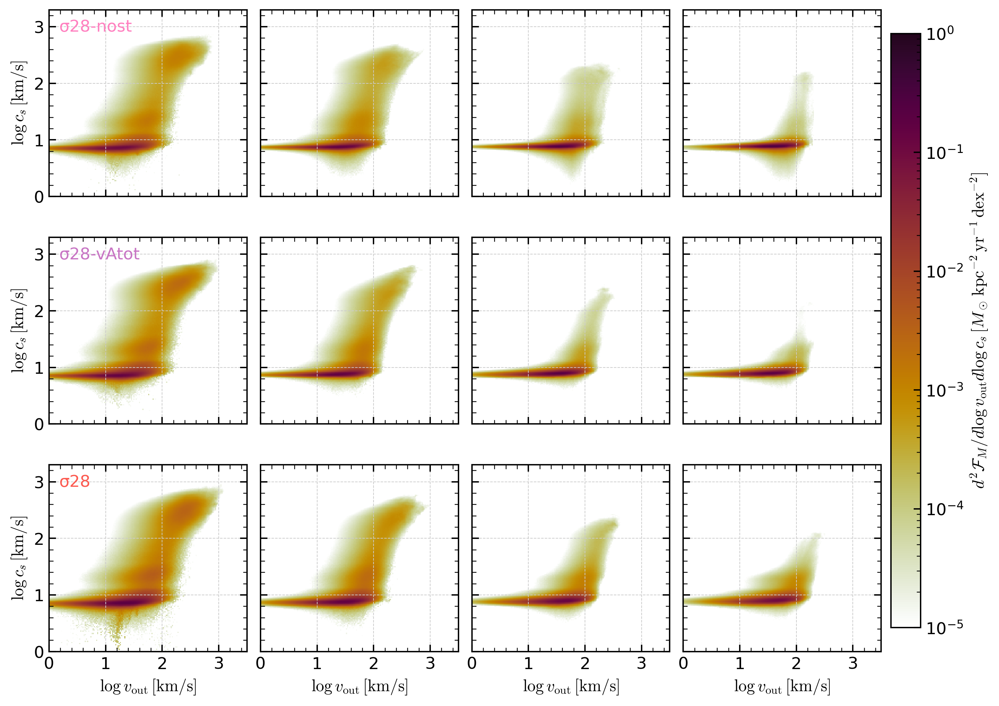

In [25]:
f=ps.plot_jointpdf(simgroup, group)

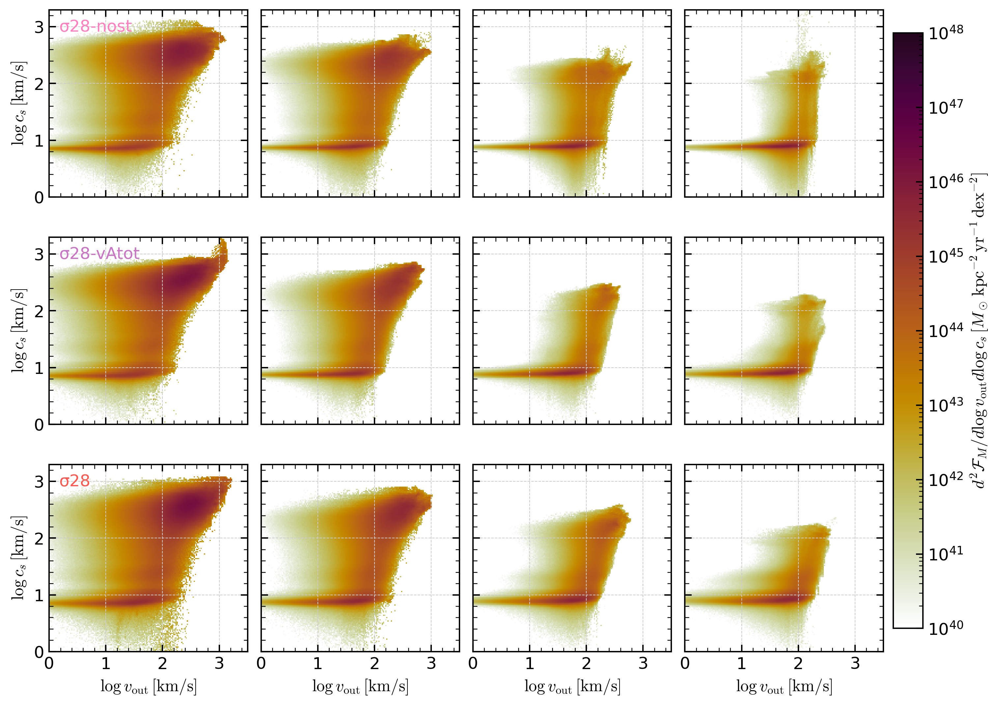

In [26]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

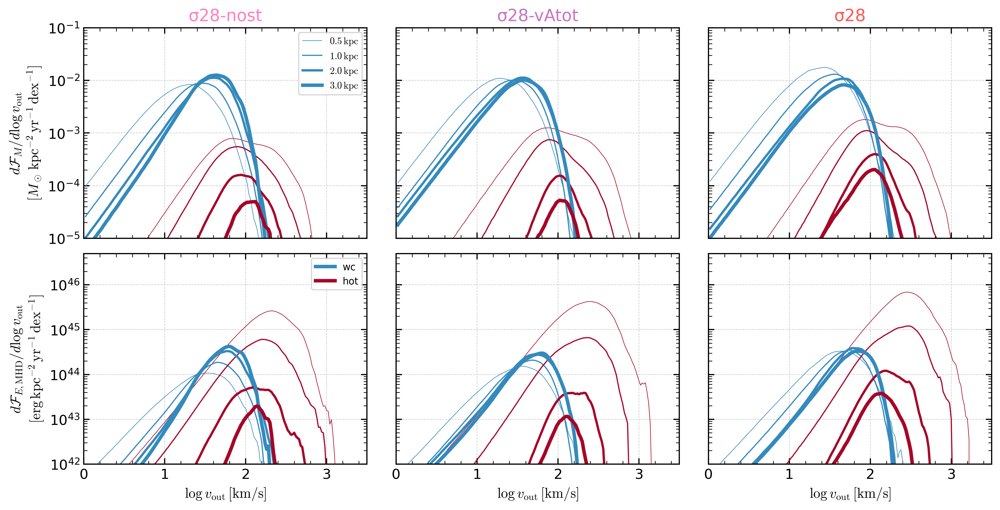

In [27]:
f=ps.plot_voutpdf(simgroup, group)

sinj 4.7042718464175334e-05
$F_{\rm in,W}$ 0.464522284903465 0.520956853833261
$F_{\rm in,SN}$ 0.11060451325697156 0.11060451665668966
$L_{\rm coll}$ 0.005642844678487822 0.006668243282401306
$F_{\rm out}$ 0.6027907601603087 0.685446647868025
$F_{\rm in}$ 0.5694839534819488 0.6248931272075496
sinj 8.436307794850258e-05
$F_{\rm in,W}$ 0.4268255353784949 0.48863868310047254
$F_{\rm in,SN}$ 0.10766326960379591 0.10766327008068513
$G_{\rm st}$ 0.01368055142119691 0.0203207262285443
$L_{\rm coll}$ 0.005421769548460159 0.0065111253620992945
$F_{\rm out}$ 0.5342697290908573 0.5842004885935882
$F_{\rm in}$ 0.5153864840126336 0.5694701015905145
sinj 0.00010171664668136736
$F_{\rm in,W}$ 0.35704132890429247 0.41926315938358144
$F_{\rm in,SN}$ 0.1106102532793189 0.11061027184436772
$G_{\rm st}$ 0.020022455402046377 0.029801624768421124
$L_{\rm coll}$ 0.004269378439068463 0.005130516792735987
$F_{\rm out}$ 0.4519776525730731 0.4997022104505855
$F_{\rm in}$ 0.44335974834249664 0.49494128966679185


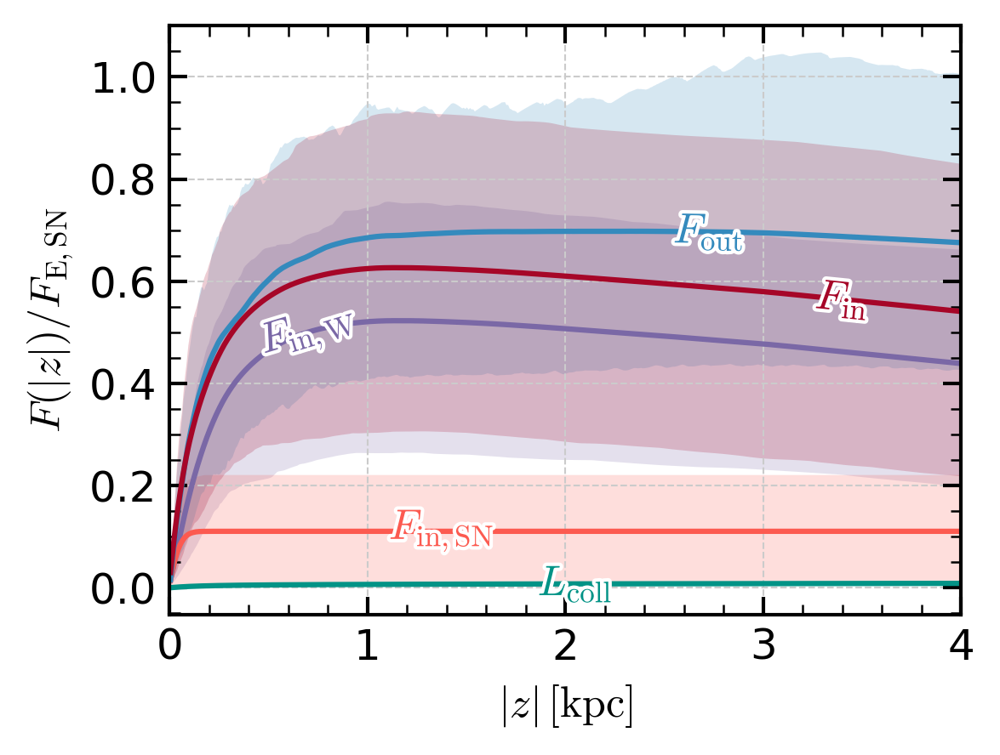

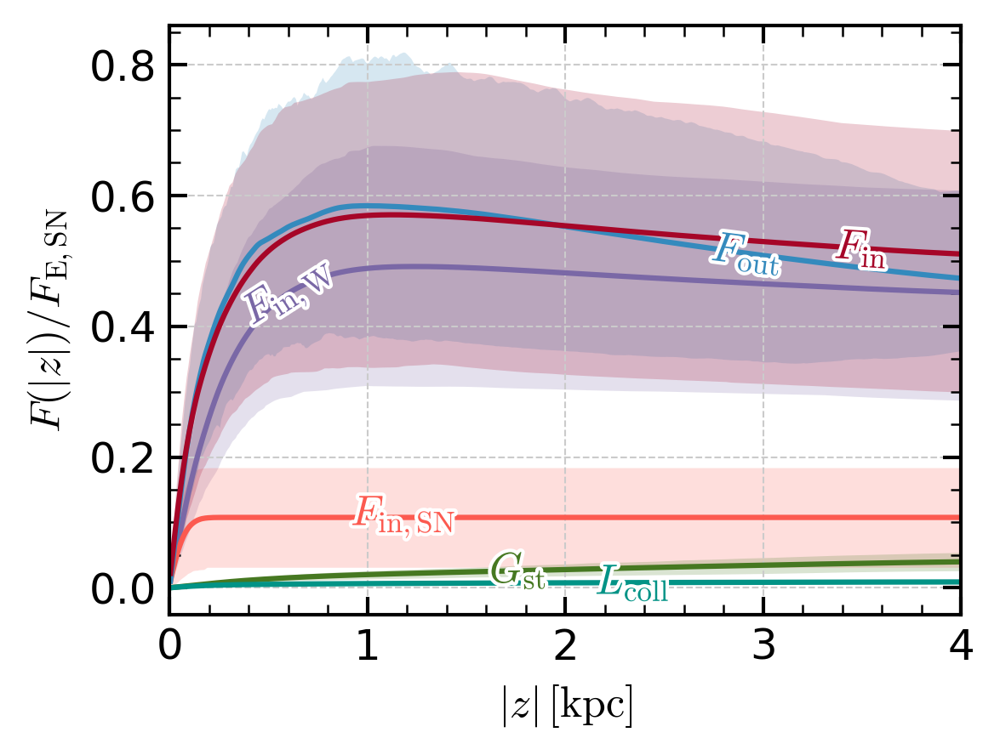

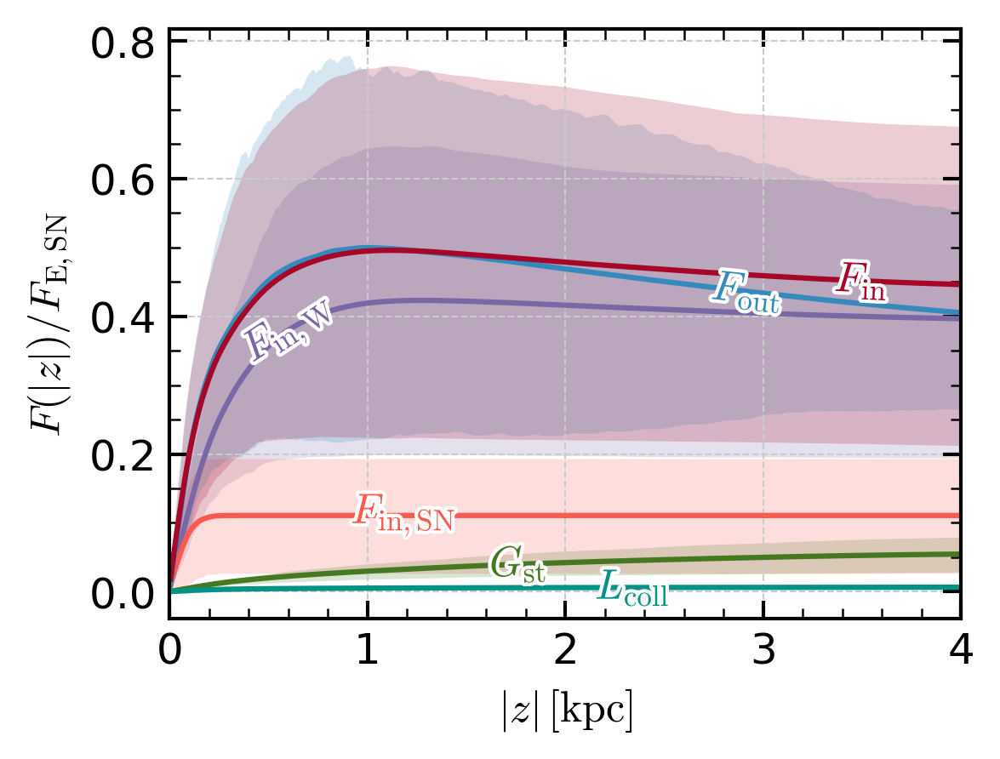

In [28]:
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        ps.plot_crgain_cumsum(s, m)

        # # will not be used in the paper, but just for checking
        # load_velocity_pdfs(s, xf="T")
        # load_kappa_pdfs(s, xf="T", yf="sigma_para")
        # ps.plot_velocity_T(s, m)

/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/labellines/core.py:181: UserWarning: Tried to label line Line2D(_child9), but could not find a label for it.
  warnings.warn(
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/labellines/core.py:181: UserWarning: Tried to la

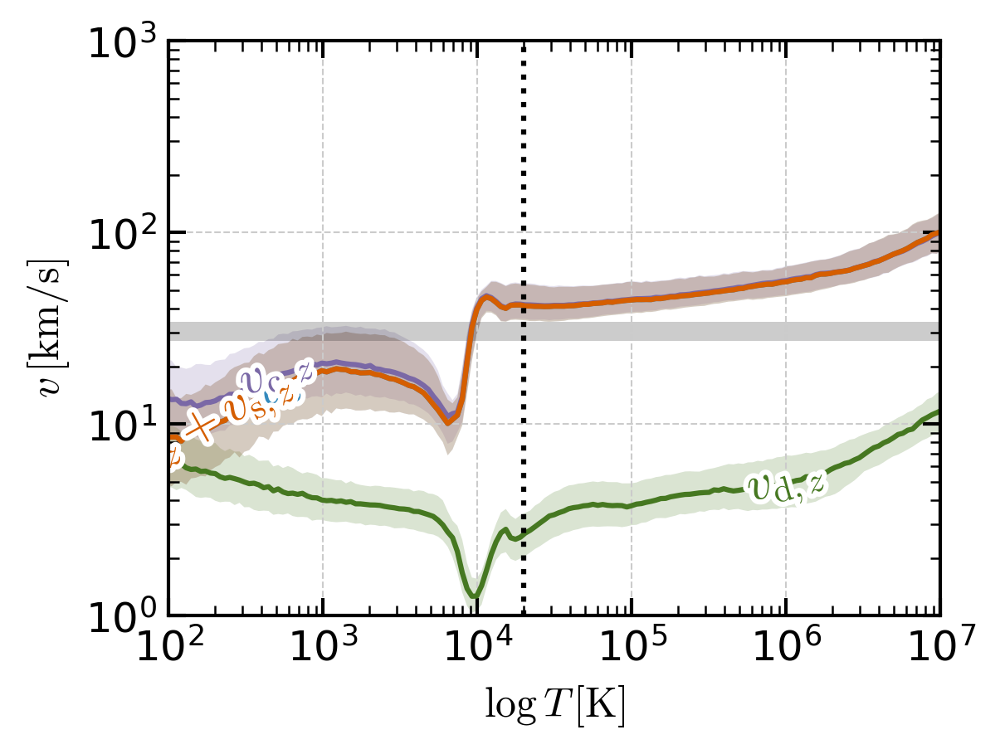

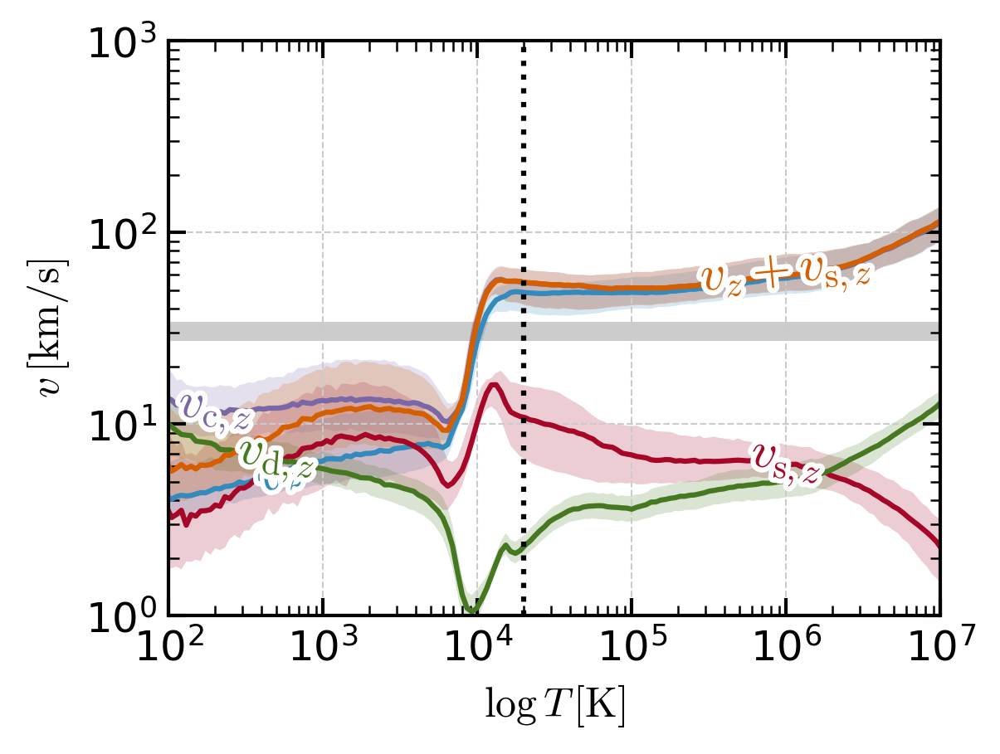

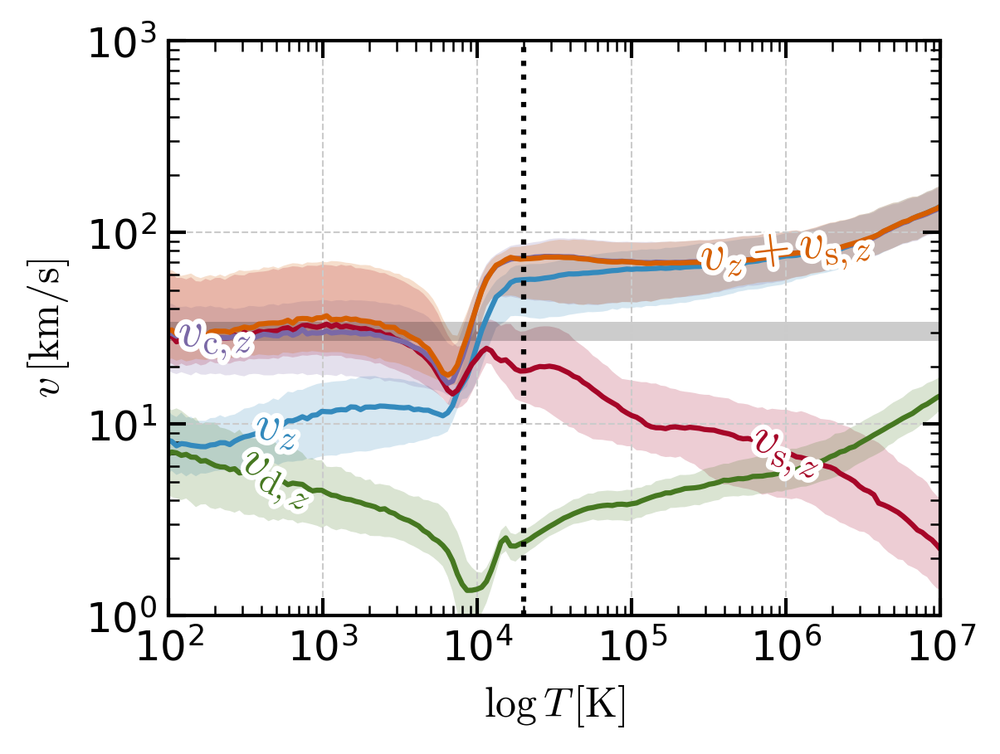

In [50]:
from cr_zprof import load_velocity_pdfs, load_kappa_pdfs
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        # will not be used in the paper, but just for checking
        load_velocity_pdfs(s, xf="T")
        load_kappa_pdfs(s, xf="T", yf="sigma_para")
        ps.plot_velocity_T(s, m)

In [74]:
for m, s in simgroup["all"].items():
    if s.options["cosmic_ray"]:
        zp_pp = s.load_zprof_postproc()

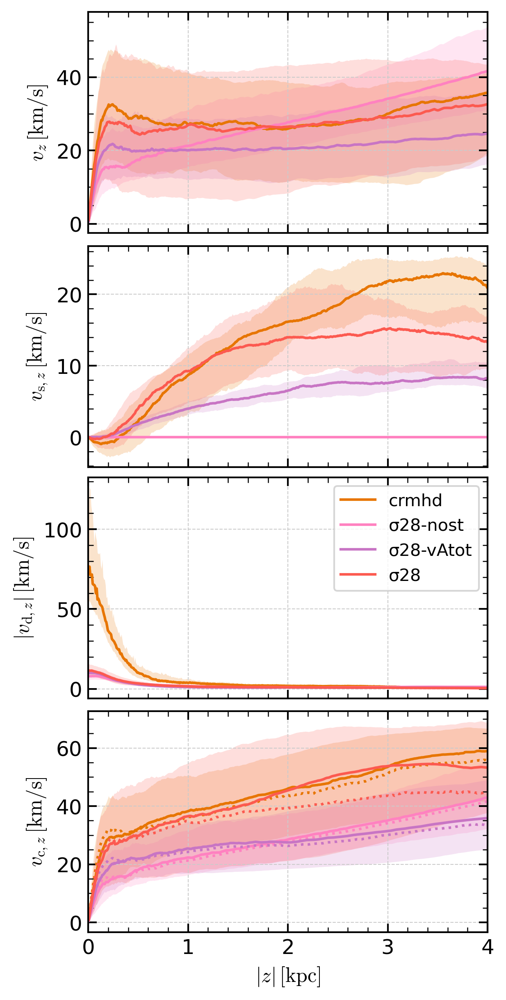

In [76]:
ps.setup(f"../{group}_figures", model_name, model_color)
f = ps.plot_cr_velocity_z_all(simgroup, "all")

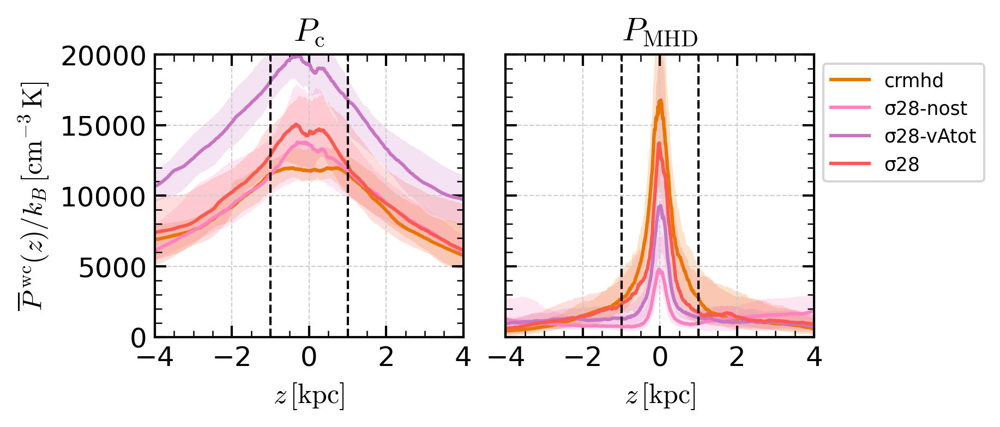

In [79]:
f = ps.plot_pressure_z_talk(simgroup,"all")
plt.setp(f.axes,"ylim",(0,2e4))
f.axes[1].legend(fontsize="x-small", bbox_to_anchor=(1,1))
plt.savefig(os.path.join(ps.fig_outdir, f"all_pressures_z_talk_lin.pdf"))